In [1]:
import pandas as pd #the csv reading library
import matplotlib as mpl
import matplotlib.pyplot as plt #the ploting library
import glob #to get file names
import numpy as np
from pandas import Series
import seaborn as sns
from matplotlib.pyplot import figure
import cmocean.cm as cmo
import seaborn as sns
from scipy.optimize import curve_fit
from itertools import product
from scipy.stats import linregress


In [2]:
df_meta = pd.read_csv('../Dissertation_projects/Data/meta_data.csv', sep=',', index_col=0)

#fix date time 
df_meta['date_time'] = pd.to_datetime(df_meta['Date'])
df_meta['Date'] = df_meta['date_time'].dt.date

df_meta

,Date,Trip,Station,Lat,Lon,Water_depth,Sample_depth,Sample_depth_units,Wavguide_Path_lengths,BC_time,BC_Chamber_vol_(L),Type,Waveguide_used,Notes,Flagged,Salinity,date_time
Sample,,,,,,,,,,,,,,,,,
211901,2021-07-15,GOM2021,St.MK,28.906820,-90.333160,16.7,16.7,M,NaN,NaN,NaN,NISK,NaN,NaN,NaN,35.223851,2021-07-15
211902,2021-07-15,GOM2021,St.MK,28.906820,-90.333163,16.7,16.7,M,NaN,NaN,NaN,NISK,NaN,NaN,NaN,35.183855,2021-07-15
211903,2021-07-15,GOM2021,St.MK,28.906660,-90.334096,16.7,14,M,NaN,NaN,NaN,NISK,NaN,NaN,NaN,34.505918,2021-07-15
211904,2021-07-15,GOM2021,St.MK,28.906660,-90.334119,16.7,14,M,NaN,NaN,NaN,NISK,NaN,NaN,NaN,34.486418,2021-07-15
211905,2021-07-15,GOM2021,St.MK,28.906531,-90.334841,16.7,10,M,NaN,NaN,NaN,NISK,NaN,NaN,NaN,32.824471,2021-07-15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225390,2022-07-23,GOM22SU,St.MK,NaN,NaN,NaN,30,CM,0.01,NaN,NaN,RHZ,1CM CUV,NaN,NaN,36.007597,2022-07-23
225391,2022-07-23,GOM22SU,St.MK,NaN,NaN,NaN,34,CM,0.01,NaN,NaN,RHZ,1CM CUV,NaN,NaN,36.007597,2022-07-23
225392,2022-07-23,GOM22SU,St.MK,NaN,NaN,NaN,38,CM,0.01,NaN,NaN,RHZ,1CM CUV,NaN,NaN,36.007597,2022-07-23


In [3]:
PW_CDOM_data = '../Dissertation_projects/Data/CDOM/sprectra_pchip_baseline_corrected_WC.csv'

df = pd.read_csv(PW_CDOM_data, sep=',', index_col=0)
df = pd.DataFrame(df)

wavelengths = list(range(250, 751))
wave_fit = list(range(450, 550))

#df = df.drop('file_id', axis = 1)


df.index = df.index.astype(str)
df_meta.index = df_meta.index.astype(str)

df = df.drop('222339')
df = df.drop('221539')

df.columns = ['a' + col for col in df.columns]

trips = ['GOM2021', 'GOM21FA', 'GOM22SP', 'GOM22SU']
stations = ['St.5B','St.4','St.MK','St.7','St.16','St.2','St.9','St.14','St.15','St.13','St.11','St.12']

df_cdom = df.join(df_meta, how='inner')

df_cdom['Sample_depth'] = pd.to_numeric(df_cdom['Sample_depth'], errors='coerce')
df_cdom['file_id'] = df_cdom['afile_id']
df_cdom = df_cdom.drop('afile_id', axis = 1)

df_cdom

,a250,a251,a252,a253,a254,a255,a256,a257,a258,a259,...,Wavguide_Path_lengths,BC_time,BC_Chamber_vol_(L),Type,Waveguide_used,Notes,Flagged,Salinity,date_time,file_id
Sample_ID,,,,,,,,,,,,,,,,,,,,,
212301,1.966948,1.907249,1.833414,1.793763,1.755289,1.716594,1.684068,1.628457,1.590463,1.587945,...,NaN,NaN,NaN,NISK,NaN,NaN,NaN,36.365759,2021-07-20,WC_Abs_GoM21Su_ID212301_Absorbance_01
212302,3.208782,3.040563,2.953443,2.847333,2.724667,2.605936,2.507259,2.378898,2.292105,2.175383,...,NaN,NaN,NaN,NISK,NaN,NaN,NaN,36.368488,2021-07-20,WC_Abs_GoM21Su_ID212302_Absorbance_01
212303,2.947587,2.900612,2.827761,2.722262,2.646043,2.570617,2.448917,2.374863,2.299453,2.211905,...,NaN,NaN,NaN,NISK,NaN,NaN,NaN,36.325783,2021-07-20,WC_Abs_GoM21Su_ID212303_Absorbance_01
212304,2.226661,2.195277,2.149554,2.083045,2.009987,1.961411,1.903917,1.842733,1.811708,1.740604,...,NaN,NaN,NaN,NISK,NaN,NaN,NaN,36.325859,2021-07-20,WC_Abs_GoM21Su_ID212304_Absorbance_01
212305,2.966302,2.873939,2.805026,2.703202,2.626770,2.531954,2.479274,2.372418,2.304180,2.236926,...,NaN,NaN,NaN,NISK,NaN,NaN,NaN,36.034262,2021-07-20,WC_Abs_GoM21Su_ID212305_Absorbance_01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225339,6.665595,6.690608,6.790543,6.745253,6.841794,6.891832,7.223834,7.041561,7.045235,6.984060,...,0.489,NaN,NaN,NISK,LWCC 50 CM #2,NaN,NaN,19.950076,2022-07-23,225339_1_103
225339,7.268334,6.669069,6.778397,6.863410,6.811121,6.912300,7.216803,7.070359,7.037288,7.138603,...,0.489,NaN,NaN,NISK,LWCC 50 CM #2,NaN,NaN,19.950076,2022-07-23,225339_2_104
225340,6.334720,6.691976,6.774561,6.781040,6.859812,6.861516,7.002140,6.981377,7.088624,7.072872,...,0.489,NaN,NaN,NISK,LWCC 50 CM #2,NaN,NaN,19.954716,2022-07-23,225340_0_105


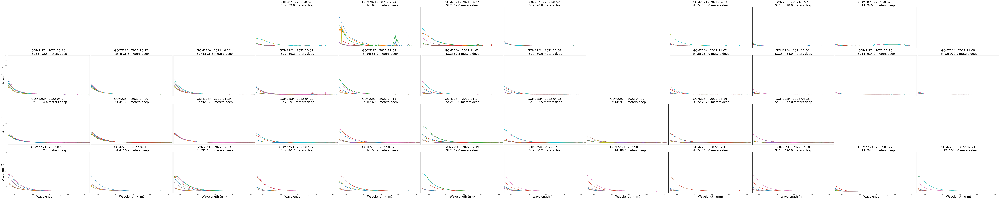

In [4]:
fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*10, len(trips)*6))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        # Filter by trip and station
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        
        plotted = False  # Flag to check if something has been plotted

        # If any data exists for this combination
        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                cdom_abs = row[:501]  # Limit to the first 501 values
                cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                wavelengths = np.asarray(wavelengths, dtype=float).ravel()
                date = row["Date"] 
                # Plot all rows in subset_df against wavelengths
                axes[i, j].plot(wavelengths, cdom_abs)  # use cdom_abs.values[0] to get the values of the row
                plotted = True
            axes[i,j].set_ylim(-1,20)
            axes[i,j].set_xlim(260,725)
            water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
            water_depth = water_depth['Water_depth'].mean()
            water_depth = round(water_depth, 1)
            axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size =25)
        else: 
            axes[i, j].axis('off')  # Turn off the axis if no data for that combination

            
        if j == 0:
            axes[i,j].set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=25, c='black')
            axes[i,j].yaxis.set_tick_params(labelsize=10)
        else: 
            axes[i,j].set_ylabel('')
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])
        
        if i == 3:
            axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
            axes[i,j].xaxis.set_tick_params(labelsize=10)
        else: 
            axes[i,j].set_xlabel('')
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

plt.tight_layout()
fig.set_facecolor('w')
plt.show()

In [5]:
#create the data for the normalization 
min_abs = df_cdom.iloc[:,:501].min().values
max_abs = df_cdom.iloc[:,:501].max().values
print(min_abs)
print(max_abs)

[ 3.10320080e-01  2.66121665e-01  2.47335305e-01  2.16923103e-01
  1.93825483e-01  1.70958776e-01  1.57755923e-01  1.37854745e-01
  1.24440140e-01  1.09775569e-01  1.01752048e-01  8.76090450e-02
  8.05876430e-02  7.10494500e-02  5.86054440e-02  4.94342350e-02
  3.41733410e-02  2.99260880e-02  2.09563230e-02  1.28323470e-02
  7.48985000e-04 -1.11081110e-02 -1.57735670e-02 -2.87374850e-02
 -3.14818120e-02 -5.15786990e-02 -5.51650260e-02 -6.51946850e-02
 -7.14925030e-02 -7.48338430e-02 -8.43005640e-02 -9.57610630e-02
 -1.01847051e-01 -1.04204429e-01 -1.14183762e-01 -1.18143428e-01
 -1.27365280e-01 -1.36377967e-01 -1.35694184e-01 -1.45258945e-01
 -1.47485099e-01 -1.57277407e-01 -1.61539896e-01 -1.69642605e-01
 -1.75401534e-01 -1.78019184e-01 -1.82248763e-01 -1.84897939e-01
 -1.85239348e-01 -1.91511412e-01 -1.93362751e-01 -1.97581157e-01
 -1.98757303e-01 -1.99417679e-01 -2.01404846e-01 -2.00543159e-01
 -2.04148199e-01 -2.01845517e-01 -2.02065839e-01 -2.01983611e-01
 -2.07318970e-01 -2.11944

In [6]:
##DEFINE EXPONENTAL REGRESSION 
#A(g)=Ae^slope
def exp_equation(x, a, s, b):
    return a * np.exp(-s * x) + b

#DEFINE HYPERBOLIC REGRESSION 
#A(g)=A(wl/532)^slope
def hyp_equation(x, a, s, b):
    return a * ((x/532)**-s) + b

#DEFINE POWER LAW REGRESSION 
def power_law(x, a, b):
    return a * (x**b)

print("the functions are set") 

the functions are set


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1

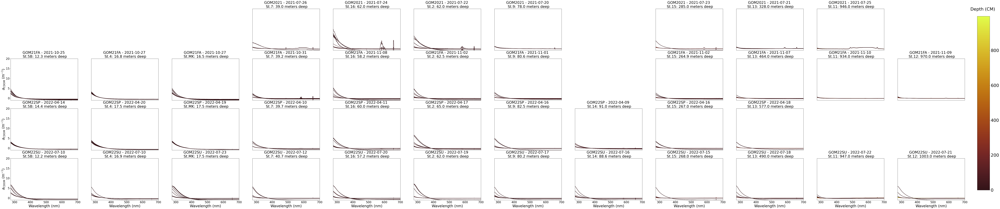

In [7]:
#Setup colormap and CDOM Spectra 

fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*10, len(trips)*6))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        # Filter by trip and station
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        plotted = False

        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                #get the data
                cdom_abs = row[:501]
                cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                
                #regression exp_equation 275 to 700
                pams = (.001, 11, 0)
                params, cv = curve_fit(exp_equation, wavelengths, cdom_abs, p0=pams, maxfev=10000000)
                a, s, b = params
    
                #print out for exp_equation 275 to 700 and calcuate rSquared
                norm_abs = cdom_abs - exp_equation(wavelengths, a, s, b)
                                
                depth = row["Sample_depth"]
                depth = np.full(501, depth)
                
                #get the date
                date = row["Date"]

                #color and plot:
                cmap=cmo.solar
                norm = plt.Normalize(vmin=-.3, vmax=df_cdom['Sample_depth'].max())
                color = cmap(norm(row["Sample_depth"]))
                axes[i, j].plot(wavelengths, norm_abs, color=color)
                
                plotted = True
            
            #set axis and lables 
            axes[i,j].set_ylim(-1,20)
            axes[i,j].set_xlim(275,700)
            water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
            water_depth = water_depth['Water_depth'].mean()
            water_depth = round(water_depth, 1)
            axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
        else: 
            axes[i, j].axis('off')

        #set y labes 
        if j == 0:
            axes[i,j].set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=25, c='black')
            axes[i,j].yaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_ylabel('')
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])
        
        #set x labes 
        if i == 3:
            axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
            axes[i,j].xaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_xlabel('')
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

#Add colorbar:
fig.subplots_adjust(right=0.89)
cbar_ax = fig.add_axes([.9, 0.15, 0.01, 0.7])
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmo.solar, norm=plt.Normalize(vmin=0, vmax=df_cdom['Sample_depth'].max())), cax=cbar_ax)
cbar.ax.set_title(f'Depth (CM) \n', fontsize = 30)
cbar.ax.tick_params(labelsize=30)

#disply and save 
#plt.tight_layout()
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/350_inflec/Water_column_spectra_SEM.png")

plt.show()

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


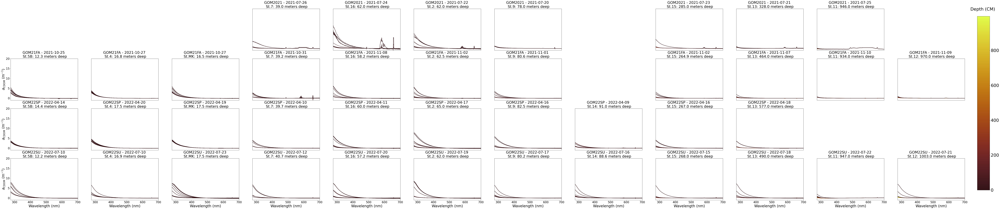

In [8]:
#Setup colormap and CDOM Spectra 

fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*10, len(trips)*6))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        # Filter by trip and station
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        plotted = False

        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                #get the data
                cdom_abs_data = row[:501]
                cdom_fit_data = row[200:300]

                cdom_abs = np.asarray(cdom_abs_data, dtype=float).ravel()
                cdom_fit = np.asarray(cdom_fit_data, dtype=float).ravel()
                
                #regression exp_equation 275 to 700
                pams = (.001, 11, 0)
                params, cv = curve_fit(exp_equation, wave_fit, cdom_fit, p0=pams, maxfev=10000000)
                a, s, b = params
    
                #print out for exp_equation 275 to 700 and calcuate rSquared
                norm_abs = cdom_abs - exp_equation(wavelengths, a, s, b)
                                
                depth = row["Sample_depth"]
                depth = np.full(501, depth)
                
                #get the date
                date = row["Date"]

                #color and plot:
                cmap=cmo.solar
                norm = plt.Normalize(vmin=-.3, vmax=df_cdom['Sample_depth'].max())
                color = cmap(norm(row["Sample_depth"]))
                axes[i, j].plot(wavelengths, norm_abs, color=color)
                
                plotted = True
            
            #set axis and lables 
            axes[i,j].set_ylim(-1,20)
            axes[i,j].set_xlim(275,700)
            water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
            water_depth = water_depth['Water_depth'].mean()
            water_depth = round(water_depth, 1)
            axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
        else: 
            axes[i, j].axis('off')

        #set y labes 
        if j == 0:
            axes[i,j].set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=25, c='black')
            axes[i,j].yaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_ylabel('')
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])
        
        #set x labes 
        if i == 3:
            axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
            axes[i,j].xaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_xlabel('')
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

#Add colorbar:
fig.subplots_adjust(right=0.89)
cbar_ax = fig.add_axes([.9, 0.15, 0.01, 0.7])
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmo.solar, norm=plt.Normalize(vmin=0, vmax=df_cdom['Sample_depth'].max())), cax=cbar_ax)
cbar.ax.set_title(f'Depth (CM) \n', fontsize = 30)
cbar.ax.tick_params(labelsize=30)

#disply and save 
#plt.tight_layout()
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/350_inflec/Water_column_spectra_SEM_450_550.png")

plt.show()

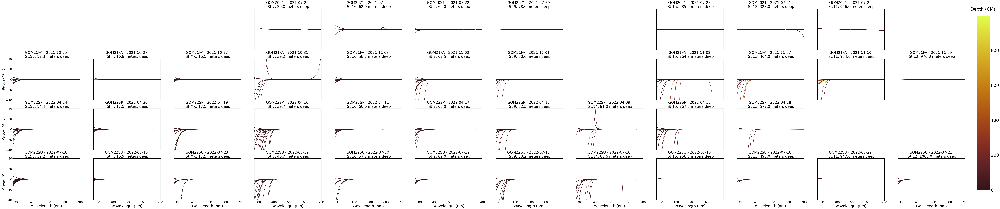

In [9]:
#Setup colormap and CDOM Spectra 

fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*10, len(trips)*6))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        # Filter by trip and station
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        plotted = False

        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                #get the data
                cdom_abs_data = row[:501]
                cdom_fit_data = row[200:300]

                cdom_abs = np.asarray(cdom_abs_data, dtype=float).ravel()
                cdom_fit = np.asarray(cdom_fit_data, dtype=float).ravel()
                
                #regression exp_equation 275 to 700
                pams = (.001, 11, 0)
                params, cv = curve_fit(hyp_equation, wave_fit, cdom_fit, p0=pams, maxfev=10000000)
                a, s, b = params
    
                #print out for exp_equation 275 to 700 and calcuate rSquared
                norm_abs = cdom_abs - hyp_equation(wavelengths, a, s, b)
                                
                depth = row["Sample_depth"]
                depth = np.full(501, depth)
                
                #get the date
                date = row["Date"]

                #color and plot:
                cmap=cmo.solar
                norm = plt.Normalize(vmin=-.3, vmax=df_cdom['Sample_depth'].max())
                color = cmap(norm(row["Sample_depth"]))
                axes[i, j].plot(wavelengths, norm_abs, color=color)
                
                plotted = True
            
            #set axis and lables 
            axes[i,j].set_ylim(-40,40)
            axes[i,j].set_xlim(275,700)
            water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
            water_depth = water_depth['Water_depth'].mean()
            water_depth = round(water_depth, 1)
            axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
        else: 
            axes[i, j].axis('off')

        #set y labes 
        if j == 0:
            axes[i,j].set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=25, c='black')
            axes[i,j].yaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_ylabel('')
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])
        
        #set x labes 
        if i == 3:
            axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
            axes[i,j].xaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_xlabel('')
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

#Add colorbar:
fig.subplots_adjust(right=0.89)
cbar_ax = fig.add_axes([.9, 0.15, 0.01, 0.7])
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmo.solar, norm=plt.Normalize(vmin=0, vmax=df_cdom['Sample_depth'].max())), cax=cbar_ax)
cbar.ax.set_title(f'Depth (CM) \n', fontsize = 30)
cbar.ax.tick_params(labelsize=30)

#disply and save 
#plt.tight_layout()
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/350_inflec/Water_column_spectra_HM_450_550.png")

plt.show()

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1

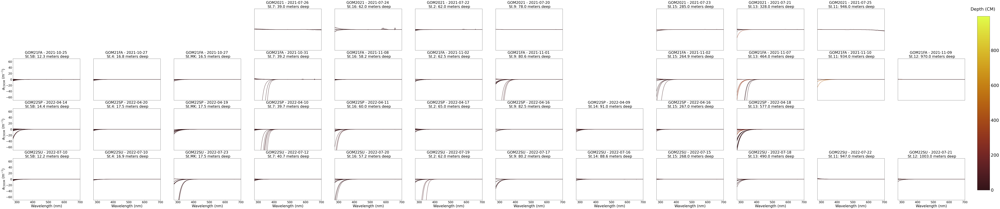

In [10]:
#Setup colormap and CDOM Spectra 

fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*10, len(trips)*6))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        # Filter by trip and station
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        plotted = False

        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                #get the data
                cdom_abs_data = row[:501]
                cdom_fit_data = row[200:300]

                cdom_abs = np.asarray(cdom_abs_data, dtype=float).ravel()
                cdom_fit = np.asarray(cdom_fit_data, dtype=float).ravel()
                
                #regression exp_equation 275 to 700
                pams = (1, 0)
                params, cv = curve_fit(power_law, wave_fit, cdom_fit, p0=pams, maxfev=10000000)
                a, b = params
    
                #print out for exp_equation 275 to 700 and calcuate rSquared
                norm_abs = cdom_abs - power_law(wavelengths, a, b)
                                
                depth = row["Sample_depth"]
                depth = np.full(501, depth)
                
                #get the date
                date = row["Date"]

                #color and plot:
                cmap=cmo.solar
                norm = plt.Normalize(vmin=-.3, vmax=df_cdom['Sample_depth'].max())
                color = cmap(norm(row["Sample_depth"]))
                axes[i, j].plot(wavelengths, norm_abs, color=color)
                
                plotted = True
            
            #set axis and lables 
            axes[i,j].set_ylim(-70,70)
            axes[i,j].set_xlim(275,700)
            water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
            water_depth = water_depth['Water_depth'].mean()
            water_depth = round(water_depth, 1)
            axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
        else: 
            axes[i, j].axis('off')

        #set y labes 
        if j == 0:
            axes[i,j].set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=25, c='black')
            axes[i,j].yaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_ylabel('')
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])
        
        #set x labes 
        if i == 3:
            axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
            axes[i,j].xaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_xlabel('')
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

#Add colorbar:
fig.subplots_adjust(right=0.89)
cbar_ax = fig.add_axes([.9, 0.15, 0.01, 0.7])
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmo.solar, norm=plt.Normalize(vmin=0, vmax=df_cdom['Sample_depth'].max())), cax=cbar_ax)
cbar.ax.set_title(f'Depth (CM) \n', fontsize = 30)
cbar.ax.tick_params(labelsize=30)

#disply and save 
#plt.tight_layout()
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/350_inflec/Water_column_spectra_PL_450_550.png")

plt.show()

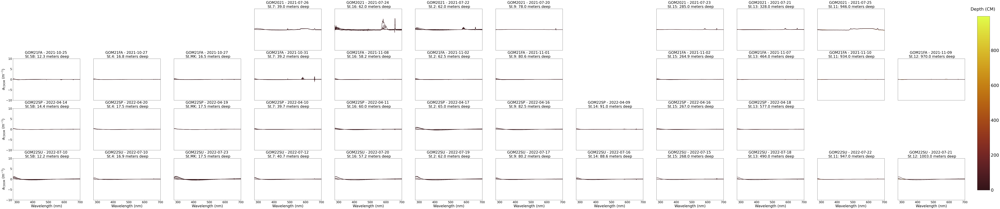

In [11]:
#Setup colormap and CDOM Spectra 

fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*10, len(trips)*6))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        # Filter by trip and station
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        plotted = False

        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                #get the data
                cdom_abs = row[:501]
                cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                
                #regression 
                pams = (.001, 11, 0)
                params, cv = curve_fit(hyp_equation, wavelengths, cdom_abs, p0=pams, maxfev=10000000)
                a, s, b = params
    
                #print out for exp_equation 275 to 700 and calcuate rSquared
                norm_abs = cdom_abs - hyp_equation(wavelengths, a, s, b)
                                
                depth = row["Sample_depth"]
                depth = np.full(501, depth)
                
                #get the date
                date = row["Date"]

                #color and plot:
                cmap=cmo.solar
                norm = plt.Normalize(vmin=-.3, vmax=df_cdom['Sample_depth'].max())
                color = cmap(norm(row["Sample_depth"]))
                axes[i, j].plot(wavelengths, norm_abs, color=color)
                
                plotted = True
            
            #set axis and lables 
            axes[i,j].set_ylim(-10,10)
            axes[i,j].set_xlim(275,700)
            water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
            water_depth = water_depth['Water_depth'].mean()
            water_depth = round(water_depth, 1)
            axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
        else: 
            axes[i, j].axis('off')

        #set y labes 
        if j == 0:
            axes[i,j].set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=25, c='black')
            axes[i,j].yaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_ylabel('')
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])
        
        #set x labes 
        if i == 3:
            axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
            axes[i,j].xaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_xlabel('')
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

#Add colorbar:
fig.subplots_adjust(right=0.89)
cbar_ax = fig.add_axes([.9, 0.15, 0.01, 0.7])
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmo.solar, norm=plt.Normalize(vmin=0, vmax=df_cdom['Sample_depth'].max())), cax=cbar_ax)
cbar.ax.set_title(f'Depth (CM) \n', fontsize = 30)
cbar.ax.tick_params(labelsize=30)

#disply and save 
#plt.tight_layout()
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/350_inflec/Water_column_spectra_HM.png")

plt.show()

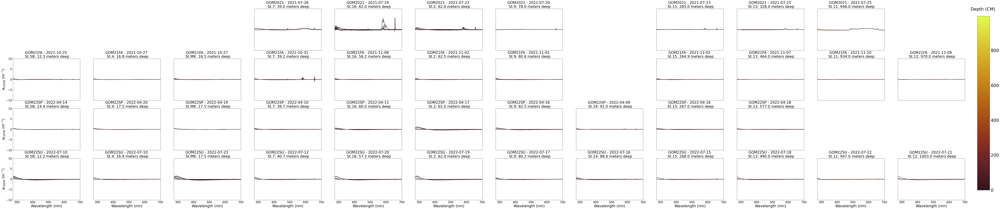

In [12]:
#Setup colormap and CDOM Spectra 

fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*10, len(trips)*6))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        # Filter by trip and station
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        plotted = False

        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                
                #get the data
                cdom_abs = row[:501]
                cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                
                #regression
                pams = (1, 0)
                params, cv = curve_fit(power_law, wavelengths, cdom_abs, p0=pams, maxfev=10000000)
                a, b = params
    
                #print out for exp_equation 275 to 700 and calcuate rSquared
                norm_abs = cdom_abs - power_law(wavelengths, a, b)
                                
                depth = row["Sample_depth"]
                depth = np.full(501, depth)
                
                #get the date
                date = row["Date"]

                #color and plot:
                cmap=cmo.solar
                norm = plt.Normalize(vmin=-.3, vmax=df_cdom['Sample_depth'].max())
                color = cmap(norm(row["Sample_depth"]))
                axes[i, j].plot(wavelengths, norm_abs, color=color)
                
                plotted = True
            
            #set axis and lables 
            axes[i,j].set_ylim(-10,10)
            axes[i,j].set_xlim(275,700)
            water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
            water_depth = water_depth['Water_depth'].mean()
            water_depth = round(water_depth, 1)
            axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
        else: 
            axes[i, j].axis('off')

        #set y labes 
        if j == 0:
            axes[i,j].set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=25, c='black')
            axes[i,j].yaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_ylabel('')
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])
        
        #set x labes 
        if i == 3:
            axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
            axes[i,j].xaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_xlabel('')
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

#Add colorbar:
fig.subplots_adjust(right=0.89)
cbar_ax = fig.add_axes([.9, 0.15, 0.01, 0.7])
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmo.solar, norm=plt.Normalize(vmin=0, vmax=df_cdom['Sample_depth'].max())), cax=cbar_ax)
cbar.ax.set_title(f'Depth (CM) \n', fontsize = 30)
cbar.ax.tick_params(labelsize=30)

#disply and save 
#plt.tight_layout()
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/350_inflec/Water_column_spectra_PL.png")

plt.show()

In [13]:
trips = ['GOM2021', 'GOM21FA', 'GOM22SP', 'GOM22SU']
stations = ['St.5B','St.4','St.MK','St.7','St.16','St.2','St.9','St.14','St.15','St.13','St.11','St.12']
df_cdom

,a250,a251,a252,a253,a254,a255,a256,a257,a258,a259,...,Wavguide_Path_lengths,BC_time,BC_Chamber_vol_(L),Type,Waveguide_used,Notes,Flagged,Salinity,date_time,file_id
Sample_ID,,,,,,,,,,,,,,,,,,,,,
212301,1.966948,1.907249,1.833414,1.793763,1.755289,1.716594,1.684068,1.628457,1.590463,1.587945,...,NaN,NaN,NaN,NISK,NaN,NaN,NaN,36.365759,2021-07-20,WC_Abs_GoM21Su_ID212301_Absorbance_01
212302,3.208782,3.040563,2.953443,2.847333,2.724667,2.605936,2.507259,2.378898,2.292105,2.175383,...,NaN,NaN,NaN,NISK,NaN,NaN,NaN,36.368488,2021-07-20,WC_Abs_GoM21Su_ID212302_Absorbance_01
212303,2.947587,2.900612,2.827761,2.722262,2.646043,2.570617,2.448917,2.374863,2.299453,2.211905,...,NaN,NaN,NaN,NISK,NaN,NaN,NaN,36.325783,2021-07-20,WC_Abs_GoM21Su_ID212303_Absorbance_01
212304,2.226661,2.195277,2.149554,2.083045,2.009987,1.961411,1.903917,1.842733,1.811708,1.740604,...,NaN,NaN,NaN,NISK,NaN,NaN,NaN,36.325859,2021-07-20,WC_Abs_GoM21Su_ID212304_Absorbance_01
212305,2.966302,2.873939,2.805026,2.703202,2.626770,2.531954,2.479274,2.372418,2.304180,2.236926,...,NaN,NaN,NaN,NISK,NaN,NaN,NaN,36.034262,2021-07-20,WC_Abs_GoM21Su_ID212305_Absorbance_01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225339,6.665595,6.690608,6.790543,6.745253,6.841794,6.891832,7.223834,7.041561,7.045235,6.984060,...,0.489,NaN,NaN,NISK,LWCC 50 CM #2,NaN,NaN,19.950076,2022-07-23,225339_1_103
225339,7.268334,6.669069,6.778397,6.863410,6.811121,6.912300,7.216803,7.070359,7.037288,7.138603,...,0.489,NaN,NaN,NISK,LWCC 50 CM #2,NaN,NaN,19.950076,2022-07-23,225339_2_104
225340,6.334720,6.691976,6.774561,6.781040,6.859812,6.861516,7.002140,6.981377,7.088624,7.072872,...,0.489,NaN,NaN,NISK,LWCC 50 CM #2,NaN,NaN,19.954716,2022-07-23,225340_0_105


In [14]:
#Hyper
fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*20, len(trips)*12))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        plotted = False

        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                # Get the data
                cdom_abs = row[:501]
                cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                
                #regression 
                pams = (.001, 11, 0)
                params, cv = curve_fit(hyp_equation, wavelengths, cdom_abs, p0=pams, maxfev=10000000)
                a, s, b = params
    
                #print out for exp_equation 275 to 700 and calcuate rSquared
                norm_abs = cdom_abs - hyp_equation(wavelengths, a, s, b)
                
                # Original plot of normalized data
                cmap=cmo.phase
                norm = plt.Normalize(vmin=-.3, vmax=df_cdom['Salinity'].max())
                color = cmap(norm(row["Salinity"]))
                axes[i, j].plot(wavelengths, norm_abs, color=color)
                
                plotted = True
                
                # Smoothing the data using rolling window
                window_size = 10  # You can adjust this based on your data
                smoothed_abs = pd.Series(norm_abs).rolling(window=window_size).mean().dropna()
                
                # Plotting the smoothed data
                wavelengths_smooth = np.linspace(250, 750, len(smoothed_abs))
                axes[i, j].plot(wavelengths_smooth, smoothed_abs, color='black', alpha=0.5)
                
                # Finding zeros in the smoothed data
                zero_crossings = np.where(np.diff(np.sign(smoothed_abs)))[0]
                # Plotting vertical lines at zero crossings of the smoothed data
                for zero in zero_crossings:
                    axes[i, j].axvline(wavelengths[window_size - 4 + zero], color=color, linestyle='-')
                
                #plot max 
                max_point = np.argmax(smoothed_abs)
                axes[i, j].axvline(wavelengths[window_size - 4 + max_point], color=color, linestyle='--')
                
                axes[i, j].axhline(0, color='grey', linestyle='-')

                # Set axis and labels
                axes[i,j].set_ylim(-5,5)
                axes[i,j].set_xlim(275,550)
                water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
                water_depth = water_depth['Water_depth'].mean()
                water_depth = round(water_depth, 1)
                axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
            else: 
                axes[i, j].axis('off')

            # Set y labels
            if j == 0:
                axes[i,j].set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=25, c='black')
                axes[i,j].yaxis.set_tick_params(labelsize=20)
            else: 
                axes[i,j].set_ylabel('')
                axes[i,j].yaxis.set_ticklabels([])
                axes[i,j].set_yticks([])
            
            # Set x labels
            if i == 3:
                axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
                axes[i,j].xaxis.set_tick_params(labelsize=20)
            else: 
                axes[i,j].set_xlabel('')
                axes[i,j].xaxis.set_ticklabels([])
                axes[i,j].set_xticks([])
            

#Add colorbar:
fig.subplots_adjust(right=0.89)
cbar_ax = fig.add_axes([.9, 0.15, 0.01, 0.7])
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmo.phase, norm=plt.Normalize(vmin=0, vmax=df_cdom['Salinity'].max())), cax=cbar_ax)
cbar.ax.set_title(f'Salinity PSU \n', fontsize = 30)
cbar.ax.tick_params(labelsize=30)
                
# Display and save
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/350_inflec/Water_column_Spectra_interects_HM.png")

plt.show()


In [15]:
#Power law  
fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*20, len(trips)*12))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        plotted = False

        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                # Get the data
                cdom_abs = row[:501]
                cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                
                # Regression exp_equation 275 to 700
                pams = (1, 0)
                params, cv = curve_fit(power_law, wavelengths, cdom_abs, p0=pams, maxfev=10000000)
                a, b = params
                
                # Normalize absorption
                norm_abs = cdom_abs - power_law(wavelengths, a, b)
                
                # Original plot of normalized data
                cmap=cmo.phase
                norm = plt.Normalize(vmin=-.3, vmax=df_cdom['Salinity'].max())
                color = cmap(norm(row["Salinity"]))
                axes[i, j].plot(wavelengths, norm_abs, color=color)
                
                plotted = True
                
                # Smoothing the data using rolling window
                window_size = 10  # You can adjust this based on your data
                smoothed_abs = pd.Series(norm_abs).rolling(window=window_size).mean().dropna()
                
                # Plotting the smoothed data
                wavelengths_smooth = np.linspace(250, 750, len(smoothed_abs))
                axes[i, j].plot(wavelengths_smooth, smoothed_abs, color='black', alpha=0.5)
                
                # Finding zeros in the smoothed data
                zero_crossings = np.where(np.diff(np.sign(smoothed_abs)))[0]
                # Plotting vertical lines at zero crossings of the smoothed data
                for zero in zero_crossings:
                    axes[i, j].axvline(wavelengths[window_size - 4 + zero], color=color, linestyle='-')
                
                #plot max 
                max_point = np.argmax(smoothed_abs)
                axes[i, j].axvline(wavelengths[window_size - 4 + max_point], color=color, linestyle='--')
                
                axes[i, j].axhline(0, color='grey', linestyle='-')


                # Set axis and labels
                axes[i,j].set_ylim(-10,10)
                axes[i,j].set_xlim(275,550)
                water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
                water_depth = water_depth['Water_depth'].mean()
                water_depth = round(water_depth, 1)
                axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
            else: 
                axes[i, j].axis('off')

            # Set y labels
            if j == 0:
                axes[i,j].set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=25, c='black')
                axes[i,j].yaxis.set_tick_params(labelsize=20)
            else: 
                axes[i,j].set_ylabel('')
                axes[i,j].yaxis.set_ticklabels([])
                axes[i,j].set_yticks([])
            
            # Set x labels
            if i == 3:
                axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
                axes[i,j].xaxis.set_tick_params(labelsize=20)
            else: 
                axes[i,j].set_xlabel('')
                axes[i,j].xaxis.set_ticklabels([])
                axes[i,j].set_xticks([])
            

#Add colorbar:
fig.subplots_adjust(right=0.89)
cbar_ax = fig.add_axes([.9, 0.15, 0.01, 0.7])
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmo.phase, norm=plt.Normalize(vmin=0, vmax=df_cdom['Salinity'].max())), cax=cbar_ax)
cbar.ax.set_title(f'Salinity PSU \n', fontsize = 30)
cbar.ax.tick_params(labelsize=30)
                
# Display and save
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/350_inflec/Water_column_Spectra_interects_PL.png")

plt.show()


In [16]:
#Hyper  
df_cdom['sample_id'] = df_cdom.index

frames = []

for idx, row in df_cdom.iterrows():
    # Get the data
    cdom_abs = row[:501]
    cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
    
    #regression 
    pams = (.001, 11, 0)
    params, cv = curve_fit(hyp_equation, wavelengths, cdom_abs, p0=pams, maxfev=10000000)
    a, s, b = params
    
    #print out for exp_equation 
    norm_abs = cdom_abs - hyp_equation(wavelengths, a, s, b)
    
    # Smoothing the data using rolling window
    window_size = 10  # You can adjust this based on your data
    smoothed_abs = pd.Series(norm_abs).rolling(window=window_size).mean().dropna()
    
   # Finding zeros in the smoothed data
    zero_crossings = np.where(np.diff(np.sign(smoothed_abs)))[0]

    # Splitting zero crossings based on their position value
    zero_cross_low = zero_crossings[zero_crossings < 100]
    zero_cross_high = zero_crossings[(zero_crossings > 100) & (zero_crossings < 250)]

    # Initial default values
    zero_cross_high_max = None
    zero_cross_low_min = None

    # Finding the max and min values if possible
    if zero_cross_high.size > 0 and zero_cross_low.size > 0: 
        zero_cross_high_max = max(zero_cross_high)
        zero_cross_low_min = min(zero_cross_low)
    
        max_point = np.argmax(smoothed_abs[zero_cross_low_min:zero_cross_high_max])
    else:
        max_point = np.nan

    # Get the max value between zero_cross_low_min and zero_cross_high_max
    if zero_cross_high_max is not None and zero_cross_low_min is not None:
        max_val = smoothed_abs[zero_cross_low_min:zero_cross_high_max].max()
    else:
        max_val = np.nan

    len_zero_cross = len(zero_crossings)
    
    sample_id = row['sample_id']
    f_id = row['file_id']
    Sample_depth = row['Sample_depth']
    Trip = row['Trip']
    Station = row['Station']
    
    d = {'sample_id_hm': sample_id, 
         'low_wl_hm': [zero_cross_low+246],
         'max_wl_hm': [max_point+246], 
         'high_wl_hm': [zero_cross_high+246],
         'max_val_sm_hm':[max_val], 
         'len_zero_cross_hm': len_zero_cross,
         'file_id_hm': f_id,
         'Depth':Sample_depth, 
         'Trip': Trip,
         'Station': Station,}
    df = pd.DataFrame(data=d)
    
    frames.append(df) # adds the new col from each scan to a part of frames 
df_hm_pre = pd.concat(frames, axis=0, ignore_index=False)
#print(len(df))
#df = df[df['len_zero_cross'] != 1]
#print(len(df))
#df = df[df['max_wl'] <= 450]
#print(len(df))
#df = df[df['max_val_sm'] >= 0]
#print(len(df))
#df = df[df['len_zero_cross'] <= 5]
print(len(df_hm_pre))

df_hm_pre

1170


,sample_id_hm,low_wl_hm,max_wl_hm,high_wl_hm,max_val_sm_hm,len_zero_cross_hm,file_id_hm,Depth,Trip,Station
0,212301,"[260, 322]",NaN,[],NaN,7,WC_Abs_GoM21Su_ID212301_Absorbance_01,77.800,GOM2021,St.9
0,212302,"[250, 288]",NaN,[],NaN,9,WC_Abs_GoM21Su_ID212302_Absorbance_01,77.800,GOM2021,St.9
0,212303,"[252, 306]",NaN,[],NaN,7,WC_Abs_GoM21Su_ID212303_Absorbance_01,73.000,GOM2021,St.9
0,212304,"[254, 315]",NaN,[],NaN,7,WC_Abs_GoM21Su_ID212304_Absorbance_01,73.000,GOM2021,St.9
0,212305,"[252, 312]",NaN,[],NaN,7,WC_Abs_GoM21Su_ID212305_Absorbance_01,44.000,GOM2021,St.9
...,...,...,...,...,...,...,...,...,...,...
0,225339,"[259, 334]",NaN,[],NaN,3,225339_1_103,1.498,GOM22SU,St.MK
0,225339,"[259, 334]",NaN,[],NaN,3,225339_2_104,1.498,GOM22SU,St.MK
0,225340,"[258, 333]",NaN,[],NaN,3,225340_0_105,1.498,GOM22SU,St.MK
0,225340,"[258, 333]",NaN,[],NaN,3,225340_1_106,1.498,GOM22SU,St.MK


In [17]:
#Power law 
df_cdom['sample_id'] = df_cdom.index

frames = []

for idx, row in df_cdom.iterrows():
    # Get the data
    cdom_abs = row[:501]
    cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                
    # Regression exp_equation 275 to 700
    pams = (1, 0)
    params, cv = curve_fit(power_law, wavelengths, cdom_abs, p0=pams, maxfev=10000000)
    a, b = params
                
    # Normalize absorption
    norm_abs = cdom_abs - power_law(wavelengths, a, b)
                
    # Smoothing the data using rolling window
    window_size = 10  # You can adjust this based on your data
    smoothed_abs = pd.Series(norm_abs).rolling(window=window_size).mean().dropna()
    
    # Finding zeros in the smoothed data
    zero_crossings = np.where(np.diff(np.sign(smoothed_abs)))[0]

    # Splitting zero crossings based on their position value
    zero_cross_low = zero_crossings[zero_crossings < 100]
    zero_cross_high = zero_crossings[(zero_crossings > 100) & (zero_crossings < 250)]

    # Initial default values
    zero_cross_high_max = None
    zero_cross_low_min = None

    # Finding the max and min values if possible
    if zero_cross_high.size > 0 and zero_cross_low.size > 0: 
        zero_cross_high_max = max(zero_cross_high)
        zero_cross_low_min = min(zero_cross_low)
    
        max_point = np.argmax(smoothed_abs[zero_cross_low_min:zero_cross_high_max])
    else:
        max_point = np.nan

    # Get the max value between zero_cross_low_min and zero_cross_high_max
    if zero_cross_high_max is not None and zero_cross_low_min is not None:
        max_val = smoothed_abs[zero_cross_low_min:zero_cross_high_max].max()
    else:
        max_val = np.nan

    len_zero_cross = len(zero_crossings)
    
    sample_id = row['sample_id']
    f_id = row['file_id']
    Sample_depth = row['Sample_depth']
    Trip = row['Trip']
    Station = row['Station']
    
    d = {'sample_id_pl': sample_id, 
         'low_wl_pl': [zero_cross_low+246],
         'max_wl_pl': [max_point+246], 
         'high_wl_pl': [zero_cross_high+246],
         'max_val_sm_pl':[max_val], 
         'len_zero_cross_pl': len_zero_cross,
         'file_id_pl': f_id,
         'Depth':Sample_depth, 
         'Trip': Trip,
         'Station': Station,}
    df = pd.DataFrame(data=d)
    
    frames.append(df) # adds the new col from each scan to a part of frames 
df_pl_pre = pd.concat(frames, axis=0, ignore_index=False)
#print(len(df))
#df = df[df['len_zero_cross'] != 1]
#print(len(df))
#df = df[df['max_wl'] <= 450]
#print(len(df))
#df = df[df['max_val_sm'] >= 0]
#print(len(df))
#df = df[df['len_zero_cross'] <= 5]
print(len(df_pl_pre))
print(len(df_hm_pre))

df_pl_pre

1170
1170


,sample_id_pl,low_wl_pl,max_wl_pl,high_wl_pl,max_val_sm_pl,len_zero_cross_pl,file_id_pl,Depth,Trip,Station
0,212301,"[260, 333]",NaN,[],NaN,9,WC_Abs_GoM21Su_ID212301_Absorbance_01,77.800,GOM2021,St.9
0,212302,"[251, 310]",NaN,[],NaN,5,WC_Abs_GoM21Su_ID212302_Absorbance_01,77.800,GOM2021,St.9
0,212303,"[253, 315]",NaN,[],NaN,9,WC_Abs_GoM21Su_ID212303_Absorbance_01,73.000,GOM2021,St.9
0,212304,"[255, 329]",NaN,[],NaN,9,WC_Abs_GoM21Su_ID212304_Absorbance_01,73.000,GOM2021,St.9
0,212305,"[253, 321]",NaN,[],NaN,15,WC_Abs_GoM21Su_ID212305_Absorbance_01,44.000,GOM2021,St.9
...,...,...,...,...,...,...,...,...,...,...
0,225339,[259],NaN,[],NaN,2,225339_1_103,1.498,GOM22SU,St.MK
0,225339,[259],NaN,[],NaN,2,225339_2_104,1.498,GOM22SU,St.MK
0,225340,"[259, 344]",NaN,[],NaN,2,225340_0_105,1.498,GOM22SU,St.MK
0,225340,"[259, 344]",NaN,[],NaN,2,225340_1_106,1.498,GOM22SU,St.MK


In [18]:
df_hm = df_hm_pre
df_pl = df_pl_pre

print('')
print('fixed index')
print('--')

df_pl.index = df_pl['sample_id_pl']
df_hm.index = df_hm['sample_id_hm']

print(len(df_pl))
print(len(df_hm))

print('')
print('clean up the Power Law data set')
print('--')

#clean up the data set 
print(len(df_pl))
df_pl = df_pl[df_pl['max_wl_pl'].notna()]
print(len(df_pl))
df_pl = df_pl[df_pl['max_val_sm_pl'].notna()]
print(len(df_pl))
df_pl = df_pl[df_pl['low_wl_pl'].astype(str) != '[]']  # Drop empty arrays
df_pl = df_pl[df_pl['low_wl_pl'].astype(str) != '']  # Drop empty strings
print(len(df_pl))
df_pl = df_pl[df_pl['high_wl_pl'].astype(str) != '[]']  # Drop empty arrays
df_pl = df_pl[df_pl['high_wl_pl'].astype(str) != '']  # Drop empty strings
print(len(df_pl))

print('')
print('clean up the Hyperbolic model data set')
print('--')

#clean up the data set 
print(len(df_hm))
df_hm = df_hm[df_hm['max_wl_hm'].notna()]
print(len(df_hm))
df_hm = df_hm[df_hm['max_val_sm_hm'].notna()]
print(len(df_hm))
df_hm = df_hm[df_hm['low_wl_hm'].astype(str) != '[]']  # Drop empty arrays
df_hm = df_hm[df_hm['low_wl_hm'].astype(str) != '']  # Drop empty strings
print(len(df_hm))
df_hm = df_hm[df_hm['high_wl_hm'].astype(str) != '[]']  # Drop empty arrays
df_hm = df_hm[df_hm['high_wl_hm'].astype(str) != '']  # Drop empty strings
print(len(df_hm))


print('')
print('Compute cartesian product for each row in Power Law data set')
print('--')
print(len(df_pl))
# Compute cartesian product for each row
df_pl['product'] = df_pl.apply(lambda row: list(product(row['low_wl_pl'], row['high_wl_pl'])), axis=1)
# Explode product column to get individual pairs
df_pl = df_pl.explode('product')
# Separate the product pairs into the original columns
df_pl['low_wl_pl'] = df_pl['product'].apply(lambda x: x[0])
df_pl['high_wl_pl'] = df_pl['product'].apply(lambda x: x[1])
# Drop the temporary product column
df_pl = df_pl.drop(columns='product')
print(len(df_pl))

print('')
print('Compute cartesian product for each row in Hyperbolic model data set')
print('--')
print(len(df_hm))
# Compute cartesian product for each row
df_hm['product'] = df_hm.apply(lambda row: list(product(row['low_wl_hm'], row['high_wl_hm'])), axis=1)
# Explode product column to get individual pairs
df_hm = df_hm.explode('product')
# Separate the product pairs into the original columns
df_hm['low_wl_hm'] = df_hm['product'].apply(lambda x: x[0])
df_hm['high_wl_hm'] = df_hm['product'].apply(lambda x: x[1])
# Drop the temporary product column
df_hm = df_hm.drop(columns='product')
print(len(df_hm))


print('')
print('Compute Triangel area for each row in Power Law data set')
print('--')
#math 
df_pl['range_pl'] = df_pl['high_wl_pl'] - df_pl['low_wl_pl']
df_pl['range_low_pl'] = df_pl['max_wl_pl'] - df_pl['low_wl_pl']
df_pl['range_high_pl'] = df_pl['high_wl_pl'] - df_pl['max_wl_pl']
df_pl['Triangel_pl'] = ((df_pl['range_low_pl']*df_pl['max_val_sm_pl'])*2) + ((df_pl['range_high_pl']*df_pl['max_val_sm_pl'])*2)

print('done')

print('')
print('Compute Triangel area for each row in Hyperbolic model data set')
print('--')
#math
df_hm['range_hm'] = df_hm['high_wl_hm'] - df_hm['low_wl_hm']
df_hm['range_low_hm'] = df_hm['max_wl_hm'] - df_hm['low_wl_hm']
df_hm['range_high_hm'] = df_hm['high_wl_hm'] - df_hm['max_wl_hm']
df_hm['Triangel_hm'] = ((df_hm['range_low_hm']*df_hm['max_val_sm_hm'])*2) + ((df_hm['range_high_hm']*df_hm['max_val_sm_hm'])*2)

print('done')



fixed index
--
1170
1170

clean up the Power Law data set
--
1170
233
233
233
233

clean up the Hyperbolic model data set
--
1170
466
466
466
466

Compute cartesian product for each row in Power Law data set
--
233
1277

Compute cartesian product for each row in Hyperbolic model data set
--
466
2821

Compute Triangel area for each row in Power Law data set
--
done

Compute Triangel area for each row in Hyperbolic model data set
--
done


In [19]:
df_iron = pd.read_csv('../Dissertation_projects/Data/IRON/Iron.csv', sep=',', index_col=0)

#make all the spots labeled NA a nan value
df_iron = df_iron.replace('NA', np.nan)
df_iron = df_iron.replace('NA ', np.nan)

#make all BDL a 0 
df_iron.loc[df_iron['FeT_uM'] == 'BLD', 'FeT_uM'] = 0
df_iron.loc[df_iron['Fe2_uM'] == 'BLD', 'Fe2_uM'] = 0

# convert columns to numeric data type
df_iron['FeT_uM'] = pd.to_numeric(df_iron['FeT_uM'], errors='coerce')
df_iron['Fe2_uM'] = pd.to_numeric(df_iron['Fe2_uM'], errors='coerce')

df_iron['FeT_uM'] = df_iron['FeT_uM'].where(pd.notna(df_iron['FeT_uM']), other=np.nan)
df_iron['Fe2_uM'] = df_iron['Fe2_uM'].where(pd.notna(df_iron['Fe2_uM']), other=np.nan)

#make all negative a 0 
df_iron.loc[df_iron['FeT_uM'] < 0, 'FeT_uM'] = 0
df_iron.loc[df_iron['Fe2_uM'] < 0, 'Fe2_uM'] = 0

#calculate Fe +3 
df_iron['Fe3_uM'] = df_iron['FeT_uM'] - df_iron['Fe2_uM']
df_iron.loc[df_iron['Fe3_uM'] < 0, 'Fe3_uM'] = 0
df_iron.loc[df_iron['Fe2_uM'] > df_iron['FeT_uM'], 'Fe3_uM'] = 0
df_iron['Fe3_uM'] = pd.to_numeric(df_iron['Fe3_uM'], errors='coerce')
df_iron['Fe3_uM'] = df_iron['Fe3_uM'].where(pd.notna(df_iron['Fe3_uM']), other=np.nan)

#time feild 
df_iron['Fe2_Time'] = pd.to_numeric(df_iron['Fe2_Time'], errors='coerce')
df_iron['Fe2_Time'] = df_iron['Fe2_Time'].where(pd.notna(df_iron['Fe2_Time']), other=np.nan)

#time feild 
df_iron['FeT_Time'] = pd.to_numeric(df_iron['FeT_Time'], errors='coerce')
df_iron['FeT_Time'] = df_iron['FeT_Time'].where(pd.notna(df_iron['FeT_Time']), other=np.nan)

# convert columns to numeric data type
df_iron['FeT_Depth'] = pd.to_numeric(df_iron['Fe2_Depth'], errors='coerce')
df_iron['Fe2_Depth'] = pd.to_numeric(df_iron['Fe2_Depth'], errors='coerce')

df_iron['FeT_uM'] = df_iron['FeT_uM'].replace(0, np.nan)
df_iron['Fe2_uM'] = df_iron['Fe2_uM'].replace(0, np.nan)
df_iron['Fe3_uM'] = df_iron['Fe3_uM'].replace(0, np.nan)

df_iron['code'] = df_iron['Location'] + '_' + df_iron['Campaign']

df_iron_wc = df_iron[df_iron['Type'] == 'WC']

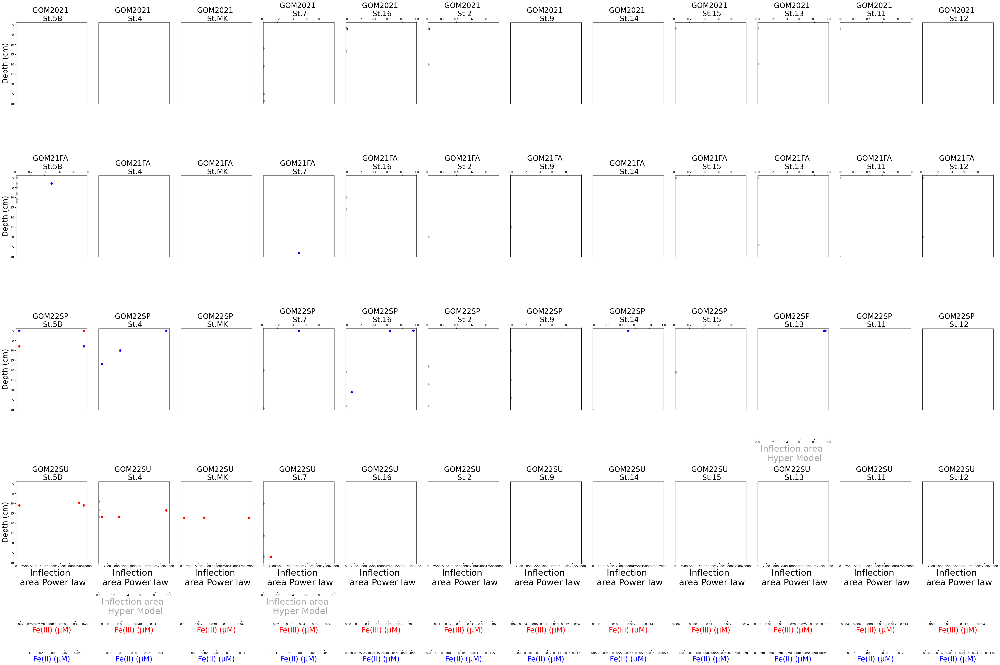

In [20]:
# Assuming you have already imported the required libraries and the datasets

#Power law  
fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*4, len(trips)*8))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        
        subset_df = df_pl[(df_pl['Trip'] == trip) & (df_pl['Station'] == station)]
        subset_df_hm = df_hm[(df_hm['Trip'] == trip) & (df_hm['Station'] == station)]
        subset_iron = df_iron_wc[(df_iron_wc['Campaign'] == trip) & (df_iron_wc['Location'] == station)]
        
        if not subset_df.empty:
            # Vectorized plotting
            axes[i, j].scatter(subset_df["Triangel_pl"], subset_df["Depth"], color='black', s = 50)
            
        if not subset_df.empty:
            # Vectorized plotting
            axes4 = axes[i, j].twiny()
            axes[i, j].scatter(subset_df_hm["Triangel_hm"], subset_df_hm["Depth"], color='darkgray', s =50)

        if not subset_iron.empty:
            axes2 = axes[i, j].twiny()
            axes3 = axes[i, j].twiny()

            axes2.scatter(subset_iron["Fe3_uM"], subset_iron["FeT_Depth"], color='r', s = 50)
            axes3.scatter(subset_iron["Fe2_uM"], subset_iron["Fe2_Depth"], color='b', s = 50)

        # Set common properties outside if-conditions
        axes[i,j].set_ylim(40, -1)
        axes[i,j].set_xlim(0,20000)
        axes[i, j].set_title(f'{trip} \n {station}', size=25)
        
        if j == 0:
            axes[i,j].set_ylabel('Depth (cm)', size=25, c='black')
        else:
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])

        if i == 3:
            axes[i,j].set_xlabel(f'Inflection \n area Power law', size=30, c='black')
            axes4.set_xlabel(f'Inflection area \n Hyper Model', size=30, c='darkgray')
            axes4.xaxis.set_ticks_position('bottom')
            axes4.xaxis.set_label_position('bottom')
            axes4.spines['bottom'].set_position(('outward', 100))  
            if not subset_iron.empty:
                axes2.set_xlabel('Fe(III) (\u03BCM)', size=25, c='r')
                axes2.xaxis.set_ticks_position('bottom')
                axes2.xaxis.set_label_position('bottom')
                axes2.spines['bottom'].set_position(('outward', 200))  
                axes3.set_xlabel('Fe(II) (\u03BCM)', size=25, c='b')
                axes3.xaxis.set_ticks_position('bottom')
                axes3.xaxis.set_label_position('bottom')
                axes3.spines['bottom'].set_position(('outward', 300))  
        else:
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])
            if not subset_iron.empty:
                axes2.xaxis.set_ticklabels([])
                axes2.set_xticks([])
                axes3.xaxis.set_ticklabels([])
                axes3.set_xticks([])

# Display and save
fig.set_facecolor('w')
plt.tight_layout()

plt.savefig("../Dissertation_projects/Figures/350_inflec/Water_column_FE_triangel_profiles.png")


plt.show()


In [21]:
df_hm_fe = df_hm.merge(df_iron_wc, left_index=True, right_index=True, how='left')
df_pl_fe = df_pl.merge(df_iron_wc, left_index=True, right_index=True, how='left')


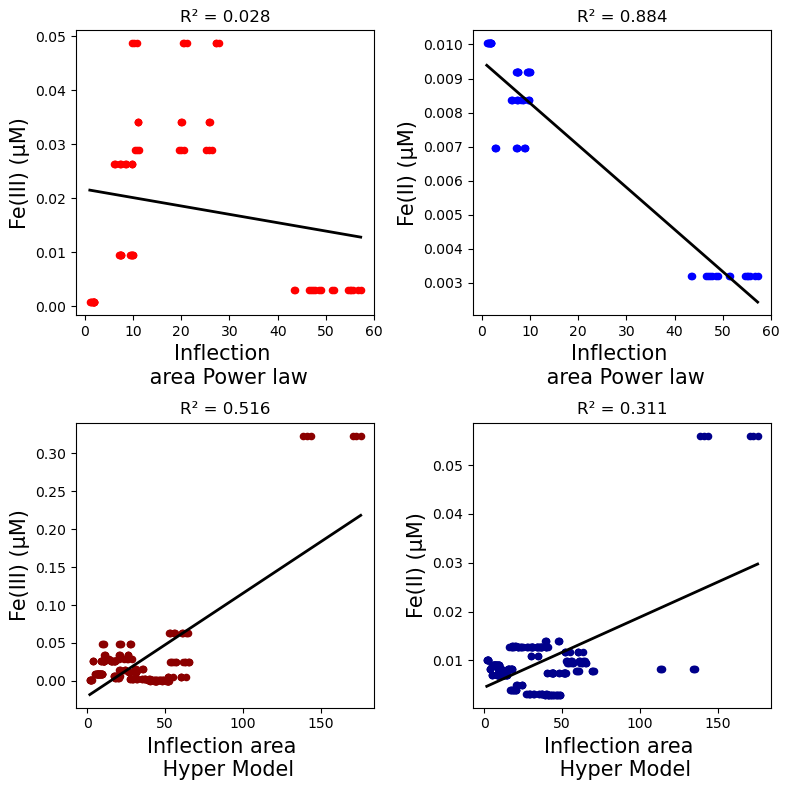

In [22]:
fig, axes = plt.subplots(2, 2, figsize=(8,8))

plots = [
    (df_pl_fe["Triangel_pl"], df_pl_fe["Fe3_uM"], 'r', 0, 0),
    (df_pl_fe["Triangel_pl"], df_pl_fe["Fe2_uM"], 'b', 0, 1),
    (df_hm_fe["Triangel_hm"], df_hm_fe["Fe3_uM"], 'darkred', 1, 0),
    (df_hm_fe["Triangel_hm"], df_hm_fe["Fe2_uM"], 'darkblue', 1, 1)
]

for x_data, y_data, color, i, j in plots:
    # Removing NaN values
    clean_data = pd.DataFrame({"x": x_data, "y": y_data}).dropna()
    x_clean = clean_data["x"]
    y_clean = clean_data["y"]
    
    slope, intercept, r_value, p_value, std_err = linregress(x_clean, y_clean)
    
    # Plotting scatter
    axes[i, j].scatter(x_clean, y_clean, color=color, s=20)
    
    # Plotting regression line
    x_range = np.linspace(min(x_clean), max(x_clean), 100)
    axes[i, j].plot(x_range, slope*x_range + intercept, color='black', linewidth=2)
    
    # Setting title as R^2 with superscript notation
    axes[i, j].set_title(f"R\u00B2 = {r_value**2:.3f}")

# Labeling axes
ylabel_texts = ['Fe(III) (\u03BCM)', 'Fe(II) (\u03BCM)', 'Fe(III) (\u03BCM)', 'Fe(II) (\u03BCM)']
xlabel_texts = ['Inflection \n area Power law', 'Inflection \n area Power law', 'Inflection area \n Hyper Model', 'Inflection area \n Hyper Model']

for ax, ylabel, xlabel in zip(axes.flat, ylabel_texts, xlabel_texts):
    ax.set_ylabel(ylabel, size=15)
    ax.set_xlabel(xlabel, size=15)

# Display and save
fig.set_facecolor('w')
plt.tight_layout()

plt.savefig("../Dissertation_projects/Figures/350_inflec/Water_column_FE_triangel_full.png")


plt.show()


ValueError: Inputs must not be empty.

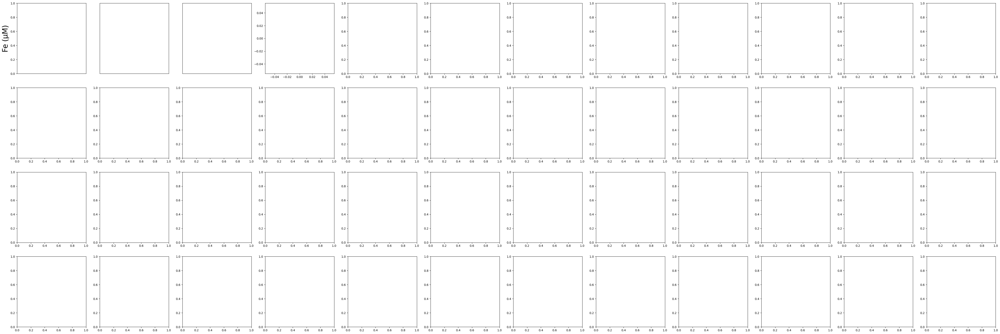

In [23]:
fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*5, len(trips)*5))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        
        subset_df = df_pl_fe[(df_pl_fe['Trip'] == trip) & (df_pl_fe['Station'] == station)]
        
        if not subset_df.empty:
            # Vectorized plotting for Fe3_uM
            axes[i, j].scatter(subset_df["Triangel_pl"], subset_df["Fe3_uM"], color='r', s=30)
            
            # Removing NaN values and plotting regression for Fe3_uM
            clean_data_fe3 = subset_df[["Triangel_pl", "Fe3_uM"]].dropna()
            slope_fe3, intercept_fe3, r_value_fe3, _, _ = linregress(clean_data_fe3["Triangel_pl"], clean_data_fe3["Fe3_uM"])
            x_range_fe3 = np.linspace(clean_data_fe3["Triangel_pl"].min(), clean_data_fe3["Triangel_pl"].max(), 100)
            axes[i, j].plot(x_range_fe3, slope_fe3*x_range_fe3 + intercept_fe3, color='r', linewidth=2)

            # Vectorized plotting for Fe2_uM
            axes[i, j].scatter(subset_df["Triangel_pl"], subset_df["Fe2_uM"], color='b', s=30)
            
            # Removing NaN values and plotting regression for Fe2_uM
            clean_data_fe2 = subset_df[["Triangel_pl", "Fe2_uM"]].dropna()
            slope_fe2, intercept_fe2, r_value_fe2, _, _ = linregress(clean_data_fe2["Triangel_pl"], clean_data_fe2["Fe2_uM"])
            x_range_fe2 = np.linspace(clean_data_fe2["Triangel_pl"].min(), clean_data_fe2["Triangel_pl"].max(), 100)
            axes[i, j].plot(x_range_fe2, slope_fe2*x_range_fe2 + intercept_fe2, color='b', linewidth=2)

            # Set title with R^2 for both Fe3_uM and Fe2_uM
            axes[i, j].set_title(f'{trip} \n {station} \n R\u00B2 (Fe3): {r_value_fe3**2:.3f} | R\u00B2 (Fe2): {r_value_fe2**2:.3f}', size=15)

        # Set other properties
        if j == 0:
            axes[i, j].set_ylabel('Fe (\u03BCM)', size=25, c='black')
        else:
            axes[i, j].yaxis.set_ticklabels([])
            axes[i, j].set_yticks([])

        if i == len(trips) - 1:  # Using dynamic length in case the number of trips changes
            axes[i, j].set_xlabel(f'Inflection \n area Power law', size=30, c='black')
        else:
            axes[i, j].xaxis.set_ticklabels([])
            axes[i, j].set_xticks([])

# Display and save
fig.set_facecolor('w')
plt.tight_layout()

plt.savefig("../Dissertation_projects/Figures/350_inflec/Water_column_FE_PL_triangel_corolations.png")

plt.show()


ValueError: Inputs must not be empty.

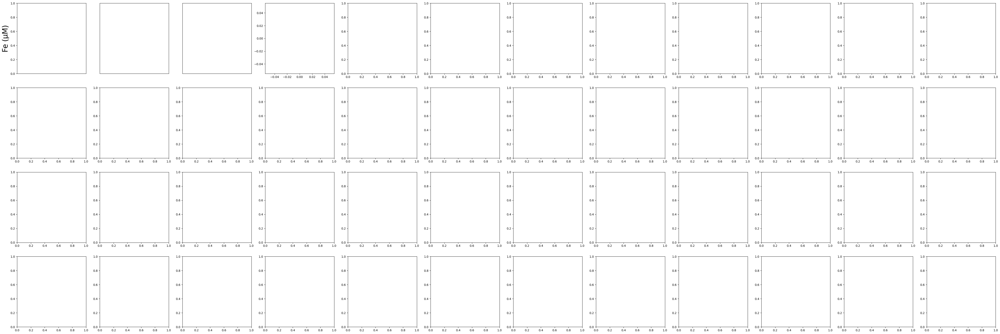

In [24]:
fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*5, len(trips)*5))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        
        subset_df = df_hm_fe[(df_hm_fe['Trip'] == trip) & (df_hm_fe['Station'] == station)]
        
        if not subset_df.empty:
            # Vectorized plotting for Fe3_uM
            axes[i, j].scatter(subset_df["Triangel_hm"], subset_df["Fe3_uM"], color='r', s=30)
            
            # Removing NaN values and plotting regression for Fe3_uM
            clean_data_fe3 = subset_df[["Triangel_hm", "Fe3_uM"]].dropna()
            slope_fe3, intercept_fe3, r_value_fe3, _, _ = linregress(clean_data_fe3["Triangel_hm"], clean_data_fe3["Fe3_uM"])
            x_range_fe3 = np.linspace(clean_data_fe3["Triangel_hm"].min(), clean_data_fe3["Triangel_hm"].max(), 100)
            axes[i, j].plot(x_range_fe3, slope_fe3*x_range_fe3 + intercept_fe3, color='r', linewidth=2)

            # Vectorized plotting for Fe2_uM
            axes[i, j].scatter(subset_df["Triangel_hm"], subset_df["Fe2_uM"], color='b', s=30)
            
            # Removing NaN values and plotting regression for Fe2_uM
            clean_data_fe2 = subset_df[["Triangel_hm", "Fe2_uM"]].dropna()
            slope_fe2, intercept_fe2, r_value_fe2, _, _ = linregress(clean_data_fe2["Triangel_hm"], clean_data_fe2["Fe2_uM"])
            x_range_fe2 = np.linspace(clean_data_fe2["Triangel_hm"].min(), clean_data_fe2["Triangel_hm"].max(), 100)
            axes[i, j].plot(x_range_fe2, slope_fe2*x_range_fe2 + intercept_fe2, color='b', linewidth=2)

            # Set title with R^2 for both Fe3_uM and Fe2_uM
            axes[i, j].set_title(f'{trip} \n {station} \n R\u00B2 (Fe3): {r_value_fe3**2:.3f} | R\u00B2 (Fe2): {r_value_fe2**2:.3f}', size=15)

        # Set other properties
        if j == 0:
            axes[i, j].set_ylabel('Fe (\u03BCM)', size=25, c='black')
        else:
            axes[i, j].yaxis.set_ticklabels([])
            axes[i, j].set_yticks([])

        if i == len(trips) - 1:  # Using dynamic length in case the number of trips changes
            axes[i, j].set_xlabel(f'Inflection \n area Hyper model', size=30, c='black')
        else:
            axes[i, j].xaxis.set_ticklabels([])
            axes[i, j].set_xticks([])

# Display and save
fig.set_facecolor('w')
plt.tight_layout()

plt.savefig("../Dissertation_projects/Figures/350_inflec/Water_column_FE_HM_triangel_corolations.png")

plt.show()


In [ ]:
#SUBSET FIGURES 

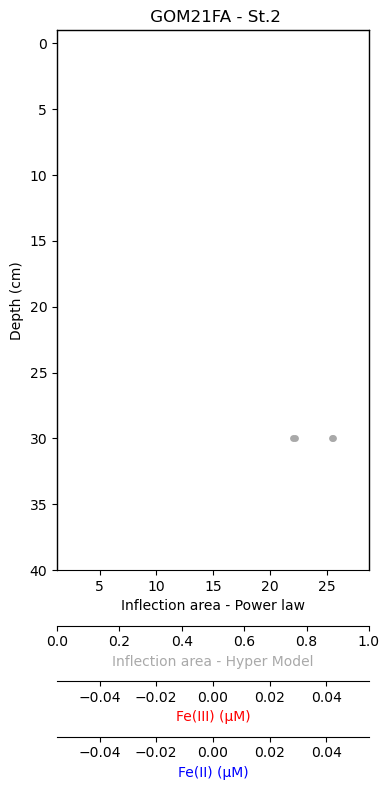

In [25]:
# Assuming you have already imported the required libraries and the datasets

subset_df = df_pl[(df_pl['Trip'] == 'GOM21FA') & (df_pl['Station'] == 'St.2')]
subset_df_hm = df_hm[(df_hm['Trip'] == 'GOM21FA') & (df_hm['Station'] == 'St.2')]
subset_iron = df_iron_wc[(df_iron_wc['Campaign'] == 'GOM21FA') & (df_iron_wc['Location'] == 'St.2')]

fig, axes = plt.subplots(1, 1, figsize=(4,8)) 

if not subset_df.empty:
    # Vectorized plotting
    axes.scatter(subset_df["Triangel_pl"], subset_df["Depth"], color='black', s = 15)
            
if not subset_df.empty:
    # Vectorized plotting
    axes4 = axes.twiny()
    axes.scatter(subset_df_hm["Triangel_hm"], subset_df_hm["Depth"], color='darkgray', s = 15)

if not subset_iron.empty:
    axes2 = axes.twiny()
    axes3 = axes.twiny()

    axes2.scatter(subset_iron["Fe3_uM"], subset_iron["FeT_Depth"], color='r', s = 10)
    axes3.scatter(subset_iron["Fe2_uM"], subset_iron["Fe2_Depth"], color='b', s = 10)

    # Set common properties outside if-conditions
    axes.set_ylim(40, -1)
    axes.set_title(f' GOM21FA - St.2', size=12)
        
    axes.set_ylabel('Depth (cm)', size=10, c='black')

    axes.set_xlabel(f'Inflection area - Power law', size=10, c='black')
    axes4.set_xlabel(f'Inflection area - Hyper Model', size=10, c='darkgray')
    axes4.xaxis.set_ticks_position('bottom')
    axes4.xaxis.set_label_position('bottom')
    axes4.spines['bottom'].set_position(('outward', 40))  

    axes2.set_xlabel('Fe(III) (\u03BCM)', size=10, c='r')
    axes2.xaxis.set_ticks_position('bottom')
    axes2.xaxis.set_label_position('bottom')
    axes2.spines['bottom'].set_position(('outward', 80))  
    axes3.set_xlabel('Fe(II) (\u03BCM)', size=10, c='b')
    axes3.xaxis.set_ticks_position('bottom')
    axes3.xaxis.set_label_position('bottom')
    axes3.spines['bottom'].set_position(('outward', 120))  

# Display and save
fig.set_facecolor('w')
plt.tight_layout()

plt.savefig("../Dissertation_projects/Figures/350_inflec/Water_column_FE_triangel_profiles_st2_gom21fa.png")


plt.show()

In [ ]:
subset_df = df_pl[(df_pl['Trip'] == 'GOM21FA') & (df_pl['Station'] == 'St.2')]
subset_df_hm = df_hm[(df_hm['Trip'] == 'GOM21FA') & (df_hm['Station'] == 'St.2')]
subset_iron = df_iron_wc[(df_iron_wc['Campaign'] == 'GOM21FA') & (df_iron_wc['Location'] == 'St.2')]

df_hm_fe = subset_df_hm.merge(subset_iron, left_index=True, right_index=True, how='left')
df_pl_fe = subset_df.merge(subset_iron, left_index=True, right_index=True, how='left')

fig, axes = plt.subplots(2, 2, figsize=(6,6))

plots = [
    (df_pl_fe["Triangel_pl"], df_pl_fe["Fe3_uM"], 'r', 0, 0),
    (df_pl_fe["Triangel_pl"], df_pl_fe["Fe2_uM"], 'b', 0, 1),
    (df_hm_fe["Triangel_hm"], df_hm_fe["Fe3_uM"], 'darkred', 1, 0),
    (df_hm_fe["Triangel_hm"], df_hm_fe["Fe2_uM"], 'darkblue', 1, 1)
]

for x_data, y_data, color, i, j in plots:
    # Removing NaN values
    clean_data = pd.DataFrame({"x": x_data, "y": y_data}).dropna()
    x_clean = clean_data["x"]
    y_clean = clean_data["y"]
    
    slope, intercept, r_value, p_value, std_err = linregress(x_clean, y_clean)
    
    # Plotting scatter
    axes[i, j].scatter(x_clean, y_clean, color=color, s=20)
    
    # Plotting regression line
    x_range = np.linspace(min(x_clean), max(x_clean), 100)
    axes[i, j].plot(x_range, slope*x_range + intercept, color='black', linewidth=2)
    
    # Setting title as R^2 with superscript notation
    axes[i, j].set_title(f"R\u00B2 = {r_value**2:.3f}")

# Labeling axes
ylabel_texts = ['Fe(III) (\u03BCM)', 'Fe(II) (\u03BCM)', 'Fe(III) (\u03BCM)', 'Fe(II) (\u03BCM)']
xlabel_texts = ['Inflection Area - Power law', 'Inflection Area - Power law', 'Inflection Area - Hyper Model', 'Inflection Area - Hyper Model']

for ax, ylabel, xlabel in zip(axes.flat, ylabel_texts, xlabel_texts):
    ax.set_ylabel(ylabel, size=10)
    ax.set_xlabel(xlabel, size=10)

# Display and save
fig.set_facecolor('w')
plt.tight_layout()

plt.savefig("../Dissertation_projects/Figures/350_inflec/Water_column_FE_triangel_full_st2_gom21fa.png")


plt.show()

In [ ]:
subs_df = df_cdom[(df_cdom['Trip'] == 'GOM21FA') & (df_cdom['Station'] == 'St.2')]

x = 18
subs_df = subs_df[x:x+1]
subs_df

#Hyper
fig, axes = plt.subplots(1,1, figsize=(8,3.5))

cdom_abs = subs_df.iloc[:,:501]
cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                
# Regression exp_equation 275 to 700
pams = (1, 0)
params, cv = curve_fit(power_law, wavelengths, cdom_abs, p0=pams, maxfev=10000000)
a, b = params
                
# Normalize absorption
norm_abs_pl = power_law(wavelengths, a, b)

#regression 
pams = (.001, 11, 0)
params, cv = curve_fit(hyp_equation, wavelengths, cdom_abs, p0=pams, maxfev=10000000)
a, s, b = params
    
#print out for exp_equation 275 to 700 and calcuate rSquared
norm_abs_hyp = hyp_equation(wavelengths, a, s, b)
            
# Original plot of normalized data
cmap=cmo.phase
norm = plt.Normalize(vmin=-.3, vmax=df_cdom['Sample_depth'].max())
color = cmap(norm(row["Sample_depth"]))
axes.plot(wavelengths, cdom_abs, color='r')
axes.plot(wavelengths, norm_abs_pl, color='b',  linestyle='--')
axes.plot(wavelengths, norm_abs_hyp, color='g',  linestyle='--')

#axes.axhline(0, color='grey', linestyle='-')

# Set axis and labels
axes.set_ylim(0,280)
axes.set_xlim(275,700)
                
axes.set_title(f'Regression Fits - GOM21FA St.2 - 3.85 (cm) Deep ', size=12)

axes.set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=10, c='black')
axes.set_xlabel('Wavelength (nm)', size=10, c='black')
   
# Display and save
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/350_inflec/Water_column_Spectra_Fits_st2_gom21fa.png")

plt.show()


In [ ]:
subs_df = df_cdom[(df_cdom['Trip'] == 'GOM21FA') & (df_cdom['Station'] == 'St.2')]

x = 18
subs_df = subs_df[x:x+1]
subs_df

#Hyper
fig, axes = plt.subplots(1,1, figsize=(8,3))

cdom_abs = subs_df.iloc[:,:501]
cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                
# Regression exp_equation 275 to 700
pams = (1, 0)
params, cv = curve_fit(power_law, wavelengths, cdom_abs, p0=pams, maxfev=10000000)
a, b = params
                
# Normalize absorption
norm_abs = cdom_abs - power_law(wavelengths, a, b)
            
# Original plot of normalized data
cmap=cmo.phase
norm = plt.Normalize(vmin=-.3, vmax=df_cdom['Sample_depth'].max())
color = cmap(norm(row["Sample_depth"]))
axes.plot(wavelengths, norm_abs, color='b')
                
plotted = True
                
window_size = 10  # You can adjust this based on your data
smoothed_abs = pd.Series(norm_abs).rolling(window=window_size).mean().dropna()
                
wavelengths_smooth = np.linspace(250, 750, len(smoothed_abs))
axes.plot(wavelengths_smooth, smoothed_abs, color='black', alpha=0.5)
                
zero_crossings = np.where(np.diff(np.sign(smoothed_abs)))[0]
# Plotting vertical lines at zero crossings of the smoothed data
for zero in zero_crossings:
    axes.axvline(wavelengths[window_size - 4 + zero], color='r', linestyle='--')
                
#plot max 
max_point = np.argmax(smoothed_abs)
axes.axvline(wavelengths[window_size - 4 + max_point], color='black', linestyle='--')
                
axes.axhline(0, color='grey', linestyle='-')

# Set axis and labels
axes.set_ylim(-20,70)
axes.set_xlim(275,550)
                
axes.set_title(f'Power Law - GOM21FA - St.2 - 3.85 (cm) Deep ', size=15)

axes.set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=10, c='black')
axes.set_xlabel('Wavelength (nm)', size=10, c='black')

# Display and save
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/350_inflec/Water_column_Spectra_interects_PL_st2_gom21fa.png")

plt.show()


In [ ]:
subs_df = df_cdom[(df_cdom['Trip'] == 'GOM21FA') & (df_cdom['Station'] == 'St.2')]

x = 18
subs_df = subs_df[x:x+1]
subs_df

#Hyper
fig, axes = plt.subplots(1,1, figsize=(8,3))

cdom_abs = subs_df.iloc[:,:501]
cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                
# Regression exp_equation 275 to 700
pams = (1, 0)
params, cv = curve_fit(power_law, wavelengths, cdom_abs, p0=pams, maxfev=10000000)
a, b = params
                
# Normalize absorption
norm_abs = cdom_abs - power_law(wavelengths, a, b)
            
# Original plot of normalized data
cmap=cmo.phase
norm = plt.Normalize(vmin=-.3, vmax=df_cdom['Sample_depth'].max())
color = cmap(norm(row["Sample_depth"]))
axes.plot(wavelengths, norm_abs, color='b')
                
plotted = True
                
window_size = 10  # You can adjust this based on your data
smoothed_abs = pd.Series(norm_abs).rolling(window=window_size).mean().dropna()
                
wavelengths_smooth = np.linspace(250, 750, len(smoothed_abs))
axes.plot(wavelengths_smooth, smoothed_abs, color='black', alpha=0.5)
                
zero_crossings = np.where(np.diff(np.sign(smoothed_abs)))[0]
# Plotting vertical lines at zero crossings of the smoothed data
for zero in zero_crossings:
    axes.axvline(wavelengths[window_size - 4 + zero], color='r', linestyle='--')
                
#plot max 
max_point = np.argmax(smoothed_abs)
axes.axvline(wavelengths[window_size - 4 + max_point], color='black', linestyle='--')
                
axes.axhline(0, color='grey', linestyle='-')

# Scatter points
axes.scatter(max_point + 254, norm_abs[max_point], c='black', s=60)
axes.scatter(zero_crossings[0] + 254, 0, c='black', s=60)
axes.scatter(zero_crossings[1] + 254, 0, c='black', s=60)

# Connect the dots with a line
x_coords = [max_point + 254, zero_crossings[0] + 254, zero_crossings[1] + 254, max_point + 254]
y_coords = [norm_abs[max_point], 0, 0, norm_abs[max_point]]

axes.plot(x_coords, y_coords, color='grey', alpha=0.5)  # 50% translucent grey line

# Fill the triangle
axes.fill(x_coords[:-1], y_coords[:-1], color='orange', alpha=0.5)  # 50% translucent orange fill

# Set axis and labels
axes.set_ylim(-20,70)
axes.set_xlim(275,550)

axes.set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=10, c='black')
axes.set_xlabel('Wavelength (nm)', size=10, c='black')

axes.set_title(f'Power Law Triangel Area - GOM21FA - St.2 - 3.85 (cm) Deep ', size=15)
    
# Display and save
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/350_inflec/Water_column_Spectra_interects_PL_st2_gom21fa_tri.png")

plt.show()


In [ ]:
subs_df = df_cdom[(df_cdom['Trip'] == 'GOM21FA') & (df_cdom['Station'] == 'St.2')]

x = 18
subs_df = subs_df[x:x+1]
subs_df

#Hyper
fig, axes = plt.subplots(1,1, figsize=(8,3))
cdom_abs = subs_df.iloc[:,:501]
cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                
#regression 
pams = (.001, 11, 0)
params, cv = curve_fit(hyp_equation, wavelengths, cdom_abs, p0=pams, maxfev=10000000)
a, s, b = params
    
#print out for exp_equation 275 to 700 and calcuate rSquared
norm_abs = cdom_abs - hyp_equation(wavelengths, a, s, b)
                
# Original plot of normalized data
cmap=cmo.phase
norm = plt.Normalize(vmin=-.3, vmax=df_cdom['Sample_depth'].max())
color = cmap(norm(row["Sample_depth"]))
axes.plot(wavelengths, norm_abs, color='g')
                
plotted = True
                
window_size = 10  # You can adjust this based on your data
smoothed_abs = pd.Series(norm_abs).rolling(window=window_size).mean().dropna()
                
wavelengths_smooth = np.linspace(250, 750, len(smoothed_abs))
axes.plot(wavelengths_smooth, smoothed_abs, color='black', alpha=0.5)
                
zero_crossings = np.where(np.diff(np.sign(smoothed_abs)))[0]
# Plotting vertical lines at zero crossings of the smoothed data
for zero in zero_crossings:
    axes.axvline(wavelengths[window_size - 4 + zero], color='r', linestyle='--')
                
#plot max 
max_point = np.argmax(smoothed_abs)
axes.axvline(wavelengths[window_size - 4 + max_point], color='black', linestyle='--')
                
axes.axhline(0, color='grey', linestyle='-')

axes.set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=10, c='black')
axes.set_xlabel('Wavelength (nm)', size=10, c='black')


# Set axis and labels
axes.set_ylim(-20,70)
axes.set_xlim(275,550)

axes.set_title(f'Hyperbolic Model - GOM21FA - St.2 - 3.85 (cm) Deep ', size=15)

# Display and save
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/350_inflec/Water_column_Spectra_interects_HM_st2_gom21fa.png")

plt.show()


In [ ]:
subs_df = df_cdom[(df_cdom['Trip'] == 'GOM21FA') & (df_cdom['Station'] == 'St.2')]

x = 18
subs_df = subs_df[x:x+1]
subs_df

#Hyper
fig, axes = plt.subplots(1,1, figsize=(8,3))
cdom_abs = subs_df.iloc[:,:501]
cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                
#regression 
pams = (.001, 11, 0)
params, cv = curve_fit(hyp_equation, wavelengths, cdom_abs, p0=pams, maxfev=10000000)
a, s, b = params
    
#print out for exp_equation 275 to 700 and calcuate rSquared
norm_abs = cdom_abs - hyp_equation(wavelengths, a, s, b)
                
# Original plot of normalized data
cmap=cmo.phase
norm = plt.Normalize(vmin=-.3, vmax=df_cdom['Sample_depth'].max())
color = cmap(norm(row["Sample_depth"]))
axes.plot(wavelengths, norm_abs, color='g')
                
plotted = True
                
window_size = 10  # You can adjust this based on your data
smoothed_abs = pd.Series(norm_abs).rolling(window=window_size).mean().dropna()
                
wavelengths_smooth = np.linspace(250, 750, len(smoothed_abs))
axes.plot(wavelengths_smooth, smoothed_abs, color='black', alpha=0.5)
                
zero_crossings = np.where(np.diff(np.sign(smoothed_abs)))[0]
# Plotting vertical lines at zero crossings of the smoothed data
for zero in zero_crossings:
    axes.axvline(wavelengths[window_size - 4 + zero], color='r', linestyle='--')
                
#plot max 
max_point = np.argmax(smoothed_abs)
axes.axvline(wavelengths[window_size - 4 + max_point], color='black', linestyle='--')
                
axes.axhline(0, color='grey', linestyle='-')

# Scatter points
axes.scatter(max_point + 254, norm_abs[max_point], c='black', s=60)
axes.scatter(zero_crossings[0] + 254, 0, c='black', s=60)
axes.scatter(zero_crossings[1] + 254, 0, c='black', s=60)

# Connect the dots with a line
x_coords = [max_point + 254, zero_crossings[0] + 254, zero_crossings[1] + 254, max_point + 254]
y_coords = [norm_abs[max_point], 0, 0, norm_abs[max_point]]

axes.plot(x_coords, y_coords, color='grey', alpha=0.5)  # 50% translucent grey line

# Fill the triangle
axes.fill(x_coords[:-1], y_coords[:-1], color='orange', alpha=0.5)  # 50% translucent orange fill


# Set axis and labels
axes.set_ylim(-20,70)
axes.set_xlim(275,550)

axes.set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=10, c='black')
axes.set_xlabel('Wavelength (nm)', size=10, c='black')

axes.set_title(f'Hyperbolic Model Triangel Area - GOM21FA - St.2 - 3.85 (cm) Deep ', size=15)

# Display and save
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/350_inflec/Water_column_Spectra_interects_HM_st2_gom21fa_tri.png")

plt.show()
